In [62]:
library(dplyr)
library(ggplot2)
library(RColorBrewer)
library(ggthemes)

In [2]:
# filename = "/hps/nobackup/stegle/users/acuomo/all_scripts/sc_neuroseq/coloc/coloc_genes_w_sample_size.txt"
# df = read.csv(filename)
# # df = read.csv(filename, sep = "\t", header = F)
# # colnames(df) = c("gwas_trait","gene_name","eqtl_map","top_GTEx_brain","top_GTEx_non_brain","category")
# # df$X = c()
# nrow(df)
# length(unique(df$gene_name))
# head(df)

In [3]:
filename = "/hps/nobackup/stegle/users/acuomo/all_scripts/sc_neuroseq/coloc/SupplementaryTable9_ColocNeuroSeq.csv"
df = read.csv(filename)
nrow(df)
length(unique(df$Ensemble_ID))
head(df)

[1] 2462

[1] 856

study_id,locus_id,celltype_tissue,Ensemble_ID,n_variants,PP0,PP1,PP2,PP3,PP4,chromosome_grch37,GWAS_index_pos_grch37,eQTL_lead_pos_grch37
GCST003496,17,FPP_D11,ENSG00000051825,889,4.539090e-04,1.798307e-01,0.000359974,0.14193782,0.6774176,12,123688849,123404966
GCST003496,28,FPP_D11,ENSG00000103512,553,3.690000e-14,1.440000e-14,0.082547906,0.03138392,0.8860682,16,14579694,14975292
GCST003496,33,FPP_D11,ENSG00000134490,644,9.601054e-02,2.454605e-01,0.041522537,0.10564513,0.5113613,18,20885128,20876486
GCST003496,58,FPP_D11,ENSG00000105968,838,3.853253e-02,4.172537e-01,0.003175182,0.03387564,0.5071629,7,44848740,44822731
GCST003724,6,FPP_D11,ENSG00000003249,1990,3.407510e-04,5.746611e-03,0.007918431,0.13268726,0.8533069,16,89706992,90054018
GCST003770,4,FPP_D11,ENSG00000109920,747,1.350620e-04,6.973547e-02,0.000370071,0.19033619,0.7394232,11,47676170,47585348


In [4]:
# DA_df = df[grep("DA",df$celltype_tissue),]
DA_df = df
nrow(DA_df)
head(DA_df)

[1] 2462

study_id,locus_id,celltype_tissue,Ensemble_ID,n_variants,PP0,PP1,PP2,PP3,PP4,chromosome_grch37,GWAS_index_pos_grch37,eQTL_lead_pos_grch37
GCST003496,17,FPP_D11,ENSG00000051825,889,4.539090e-04,1.798307e-01,0.000359974,0.14193782,0.6774176,12,123688849,123404966
GCST003496,28,FPP_D11,ENSG00000103512,553,3.690000e-14,1.440000e-14,0.082547906,0.03138392,0.8860682,16,14579694,14975292
GCST003496,33,FPP_D11,ENSG00000134490,644,9.601054e-02,2.454605e-01,0.041522537,0.10564513,0.5113613,18,20885128,20876486
GCST003496,58,FPP_D11,ENSG00000105968,838,3.853253e-02,4.172537e-01,0.003175182,0.03387564,0.5071629,7,44848740,44822731
GCST003724,6,FPP_D11,ENSG00000003249,1990,3.407510e-04,5.746611e-03,0.007918431,0.13268726,0.8533069,16,89706992,90054018
GCST003770,4,FPP_D11,ENSG00000109920,747,1.350620e-04,6.973547e-02,0.000370071,0.19033619,0.7394232,11,47676170,47585348


In [5]:
#load map HGNC to ensembl
mapping_df = read.csv('/nfs/leia/research/stegle/dseaton/genomes/hg19/annotation/geneid_mappings/hgnc_symbol2ensembl_gene_id.txt', sep='\t')
head(mapping_df,2)

hgnc_symbol,ensembl_gene_id
SLC25A26,ENSG00000261657
,ENSG00000223116


In [6]:
DA_df$ensembl_gene_id = DA_df$Ensemble_ID
DA_df0 = left_join(DA_df, mapping_df)

Joining, by = "ensembl_gene_id"


In [7]:
head(DA_df0,2)

study_id,locus_id,celltype_tissue,Ensemble_ID,n_variants,PP0,PP1,PP2,PP3,PP4,chromosome_grch37,GWAS_index_pos_grch37,eQTL_lead_pos_grch37,ensembl_gene_id,hgnc_symbol
GCST003496,17,FPP_D11,ENSG00000051825,889,4.53909e-04,1.798307e-01,0.000359974,0.14193782,0.6774176,12,123688849,123404966,ENSG00000051825,MPHOSPH9
GCST003496,28,FPP_D11,ENSG00000103512,553,3.69000e-14,1.440000e-14,0.082547906,0.03138392,0.8860682,16,14579694,14975292,ENSG00000103512,NOMO1


In [8]:
DA_df0$gene = DA_df0$hgnc_symbol
df_coloc = DA_df0[,c("gene","PP4","study_id","celltype_tissue","ensembl_gene_id")]

In [9]:
filename = "/hps/nobackup/stegle/users/acuomo/all_scripts/struct_LMM2/sc_neuroseq/May2021/genetic_effect/scaled_absolute_eff_sizes_20mofas_as_spatial_downsample_50pct_cluster_labels.csv"
df_clusters = read.csv(filename, row.names=1)

In [10]:
df_clusters$eqtl = df_clusters$gene
df_clusters$gene = gsub("\\.","-",gsub("_.*","",df_clusters$eqtl))
df_clusters$eqtl = gsub("_-","-",df_clusters$eqtl)
head(df_clusters[,c("gene","label","eqtl")],2)

,gene,label,eqtl
0,ABHD10,4,ABHD10-3_111697439_T_G
1,ABHD12B,5,ABHD12B-14_51328222_C_T


In [11]:
nrow(df_clusters)

[1] 212

In [12]:
head(df_coloc,2)

gene,PP4,study_id,celltype_tissue,ensembl_gene_id
MPHOSPH9,0.6774176,GCST003496,FPP_D11,ENSG00000051825
NOMO1,0.8860682,GCST003496,FPP_D11,ENSG00000103512


In [13]:
nrow(df_coloc)

[1] 2462

In [14]:
unique(df_clusters$gene)[unique(df_clusters$gene) %in% unique(df_coloc$gene)]

[1] "ATG10"    "CHRNA3"   "EIF5A"    "GALNT10"  "GPR171"   "KIF17"   
 [7] "KLRC2"    "MAPT-AS1" "MAST3"    "MPHOSPH9" "NDST4"    "PCDHA9"  
[13] "PEX6"     "PRKCA"    "PRR7-AS1" "PRSS36"   "RGS14"    "RHEBL1"  
[19] "SLC35E2"  "STAT6"    "SUMF1"    "TUBGCP4"  "ZFR2"

In [15]:
df_to_plot = inner_join(df_clusters[,c("gene","label","eqtl")], df_coloc)
length(unique(df_to_plot$gene))
df_to_plot[df_to_plot$study_id == "SCZ2",]

Joining, by = "gene"


[1] 23

,gene,label,eqtl,PP4,study_id,celltype_tissue,ensembl_gene_id
11,CHRNA3,2,CHRNA3-15_78849034_T_C,0.5748824,SCZ2,DA_D52_NONE,ENSG00000080644
46,MPHOSPH9,4,MPHOSPH9-12_123604053_C_T,0.6290568,SCZ2,P_FPP_D11,ENSG00000051825
59,MPHOSPH9,4,MPHOSPH9-12_123604053_C_T,0.7071876,SCZ2,Astro_D52_NONE,ENSG00000051825
61,MPHOSPH9,4,MPHOSPH9-12_123604053_C_T,0.5965651,SCZ2,DA_D52_ROT,ENSG00000051825
64,MPHOSPH9,4,MPHOSPH9-12_123604053_C_T,0.7003568,SCZ2,DA_D52_NONE,ENSG00000051825
71,MPHOSPH9,4,MPHOSPH9-12_123604053_C_T,0.6932904,SCZ2,Epen1_D52_NONE,ENSG00000051825
74,MPHOSPH9,4,MPHOSPH9-12_123604053_C_T,0.6040596,SCZ2,Sert_D52_ROT,ENSG00000051825
79,PCDHA9,5,PCDHA9-5_140186438_G_C,0.6301593,SCZ2,FPP_D30,ENSG00000204961
80,PCDHA9,5,PCDHA9-5_140186438_G_C,0.5440437,SCZ2,Epen1_D30,ENSG00000204961
82,PCDHA9,5,PCDHA9-5_140186438_G_C,0.7058493,SCZ2,Sert_D52_ROT,ENSG00000204961


In [16]:
df_to_plot[df_to_plot$gene == 'SLC35E2',]

,gene,label,eqtl,PP4,study_id,celltype_tissue,ensembl_gene_id
102,SLC35E2,4,SLC35E2-1_1660978_C_A,0.5329842,NEALE2_1200,FPP_D11,ENSG00000215790
103,SLC35E2,4,SLC35E2-1_1660978_C_A,0.5372507,NEALE2_1200,DA_D52_ROT,ENSG00000215790
104,SLC35E2,4,SLC35E2-1_1660978_C_A,0.5171821,NEALE2_1200,Epen1_D52_ROT,ENSG00000215790


In [17]:
# write.csv(df_to_plot, "/hps/nobackup/stegle/users/acuomo/all_scripts/struct_LMM2/sc_neuroseq/da_coloc_GxC.csv")
write.csv(df_to_plot, "/hps/nobackup/stegle/users/acuomo/all_scripts/struct_LMM2/sc_neuroseq/coloc_GxC.csv")

In [18]:
## load individual eQTL genetic effects
df = read.csv("/hps/nobackup/stegle/users/acuomo/all_scripts/struct_LMM2/sc_neuroseq/May2021/genetic_effect/MOFA10/eqtl_tot_genetic_effect_all.txt", sep="\t",row.names = 1)
colnames(df) = gsub("_-","-",gsub("\\.","-",colnames(df)))
head(df,2)
nrow(df)

,ABHD10-3_111697439_T_G,ABHD12B-14_51328222_C_T,ACKR2-3_42817129_C_T,ADD2-2_70894426_A_T,ADSL-22_40757228_A_C,AIM1L-1_26673825_C_T,AKAP7-6_131691964_C_A,ALDH7A1-5_126011412_G_A,ANKRD18B-9_33524775_C_A,APIP-11_34905987_T_C,...,YWHAE-17_1246420_G_A,ZBBX-3_167080934_T_G,ZC3HAV1-7_138730361_T_C,ZFR2-19_3840157_C_T,ZG16B-16_2871121_T_C,ZNF423-16_49599995_C_G,ZNF552-19_58315273_G_A,ZNF738-19_21474173_G_A,ZNF77-19_2936535_G_A,ZP3-7_76177284_C_T
HPSI0714i-iudw_1--DA--d30--0,-0.2108622,0.003924475,0.02206444,0.02834211,0.2235163,-0.03575032,-0.09473256,0.006901295,0.0006737957,-0.07499119,...,0.06962421,0.1120253,-0.04172133,0.01126897,0.1057579,-0.03101814,0.0909417,0.3020245,-0.1583842,-0.05596878
HPSI0714i-iudw_1--DA--d30--1,-0.2283969,-0.047217741,0.10596178,0.02514689,-0.1921801,-0.01471768,0.01878961,-0.171038975,-0.1105473675,-0.18686595,...,-0.21070417,0.3759854,0.08774666,0.02505916,-0.1950055,-0.22780547,0.0775938,0.3452492,-0.3472152,-0.15259400


[1] 8352

In [19]:
colnames(df)

[1] "ABHD10-3_111697439_T_G"         "ABHD12B-14_51328222_C_T"       
  [3] "ACKR2-3_42817129_C_T"           "ADD2-2_70894426_A_T"           
  [5] "ADSL-22_40757228_A_C"           "AIM1L-1_26673825_C_T"          
  [7] "AKAP7-6_131691964_C_A"          "ALDH7A1-5_126011412_G_A"       
  [9] "ANKRD18B-9_33524775_C_A"        "APIP-11_34905987_T_C"          
 [11] "ATE1-AS1-10_123688152_A_T"      "ATG10-5_81395824_T_G"          
 [13] "B4GALT5-20_48251139_G_A"        "BATF3-1_212852832_T_C"         
 [15] "BTBD9-6_38162310_A_G"           "C11orf24-11_68006555_G_A"      
 [17] "C15orf57-15_40835667_T_G"       "C17orf50-17_34107165_T_C"      
 [19] "C19orf10-19_4664038_T_C"        "C20orf201-20_62715548_C_A"     
 [21] "C21orf119-21_33728588_C_A"      "C22orf29-22_19833781_G_A"      
 [23] "C2orf40-2_106682705_A_G"        "C9orf64-9_86632743_G_A"        
 [25] "CAMKK2-12_121671970_C_G"        "CBWD2-2_114235568_A_C"         
 [27] "CCDC58-3_122131777_C_G"         "CCDC80-3_112337467_T_C"        
 [29] "CCZ1B-7_6884764_A_C"            "CD14-5_140006430_C_T"          
 [31] "CD36-7_80240689_T_C"            "CDC42SE2-5_130921388_G_A"      
 [33] "CEACAM21-19_42092815_T_A"       "CECR1-22_17685194_T_A"         
 [35] "CENPP-9_94966486_T_G"           "CERS5-12_50506816_G_T"         
 [37] "CHDH-3_53855083_C_T"            "CHEK1-11_125468231_T_C"        
 [39] "CHRNA3-15_78849034_T_C"         "CHRNA5-15_78733390_A_T"        
 [41] "CKAP2-13_52993412_G_A"          "CNOT6L-4_78754433_T_C"         
 [43] "COLGALT2-1_183906089_A_G"       "CPNE1-20_34355608_T_C"         
 [45] "CRB2-9_126155803_G_T"           "CROCCP2-1_16849660_G_C"        
 [47] "CRYBB2-22_25845855_C_G"         "CRYZ-1_75213088_G_A"           
 [49] "CTSF-11_66335308_T_C"           "CYB5A-18_72011117_T_A"         
 [51] "CYP4V2-4_187120753_A_G"         "DAAM1-14_59824445_C_A"         
 [53] "DHDH-19_49441650_A_G"           "DHRS4L2-14_24405051_G_A"       
 [55] "DNAJA1-9_32986248_T_C"          "DNAJC15-13_43597706_C_T"       
 [57] "DNPH1-6_43122062_C_A"           "ECHDC3-10_11841338_A_G"        
 [59] "EFHB-3_19987539_G_T"            "EIF5A-17_7207964_A_C"          
 [61] "EPCAM-2_47590762_C_T"           "EXT2-11_44237680_T_C"          
 [63] "EYA3-1_28347450_C_A"            "FAHD1-16_1942931_C_T"          
 [65] "FAM118A-22_45764874_T_C"        "FAM153B-5_175511318_C_T"       
 [67] "FAM21A-10_51813097_T_C"         "FAXC-6_99705415_C_T"           
 [69] "FBP1-9_97408971_A_G"            "FBXO27-19_39539632_G_A"        
 [71] "FN3K-17_80751292_T_G"           "GALNT10-5_153526051_G_A"       
 [73] "GM2A-5_150653612_C_G"           "GPR171-3_150847047_A_G"        
 [75] "GPR22-7_106914944_T_C"          "GSTT1-22_24338936_T_C"         
 [77] "GUCY2D-17_7922767_A_G"          "HLA-DRB5-6_32551716_C_G"       
 [79] "HMBOX1-8_28909523_C_T"          "HSD17B4-5_118804583_C_A"       
 [81] "HSPA4-5_132428503_T_C"          "IGSF22-11_18728650_T_C"        
 [83] "IKBIP-12_99112323_A_G"          "IRF5-7_128580042_A_G"          
 [85] "ITGB3BP-1_63958446_A_C"         "KANK3-19_8379714_G_A"          
 [87] "KANSL1-17_44311107_G_C"         "KIAA0513-16_85118494_T_G"      
 [89] "KIF17-1_21041116_T_C"           "KIF6-6_39584856_T_C"           
 [91] "KLK10-19_51518297_A_G"          "KLRC2-12_10628822_T_C"         
 [93] "KNOP1-16_19706199_A_G"          "KRTAP5-AS1-11_1623976_T_C"     
 [95] "LINC00339-1_22439520_T_C"       "LSM6-4_147102472_T_C"          
 [97] "MAP1B-5_71496419_A_G"           "MAPT-AS1-17_43925297_C_T"      
 [99] "MAST3-19_18275532_G_A"          "MEIOB-16_1836393_G_A"          
[101] "MGST3-1_165599649_C_T"          "MIAT-22_27062038_T_C"          
[103] "MPHOSPH9-12_123604053_C_T"      "MTERFD2-2_242019288_C_T"       
[105] "MUC20-3_195659169_A_G"          "MYO5B-18_47341538_C_T"         
[107] "MZT2A-2_132249372_C_T"          "NAPRT1-8_144676862_C_T"        
[109] "NDST4-4_115734311_A_G"          "NEK3-13_52714837_C_A"          
[111] "NEK8-17_27179518_A_G"           "NF

In [20]:
df[,colnames(df) %in% gsub("\\.","-",df_to_plot$eqtl)]

,ATG10-5_81395824_T_G,CHRNA3-15_78849034_T_C,EIF5A-17_7207964_A_C,GALNT10-5_153526051_G_A,GPR171-3_150847047_A_G,KIF17-1_21041116_T_C,KLRC2-12_10628822_T_C,MAPT-AS1-17_43925297_C_T,MAST3-19_18275532_G_A,MPHOSPH9-12_123604053_C_T,...,PRKCA-17_64807228_C_G,PRR7-AS1-5_176904279_C_G,PRSS36-16_31117698_C_T,RGS14-5_176799992_T_C,RHEBL1-12_49464449_A_G,SLC35E2-1_1660978_C_A,STAT6-12_57509569_C_T,SUMF1-3_4393684_G_A,TUBGCP4-15_43597297_T_A,ZFR2-19_3840157_C_T
HPSI0714i-iudw_1--DA--d30--0,0.060440086,0.118569827,0.1296384852,0.209933219,0.45140258,-0.062465506,-0.3498295479,0.0542699293,0.0030331205,0.158618581,...,-0.001126165,0.106098361,-0.0796180858,0.14424574,-0.05690643,-0.0824433829,0.091174012,0.087522687,-0.09245091,0.011268972
HPSI0714i-iudw_1--DA--d30--1,0.018365300,0.052383562,-0.0597734446,-0.003609663,0.13609726,-0.116021405,-0.1921076897,0.0670824087,0.0375575354,0.004920595,...,-0.123249380,0.078553223,-0.0661086413,0.30720327,-0.04666583,-0.1636558281,-0.052103212,-0.133917927,-0.12409677,0.025059162
HPSI0714i-iudw_1--DA--d30--2,-0.033297243,0.060170449,0.2833755453,0.095065651,0.41227586,-0.172059868,-0.1177859290,0.0482053258,-0.1231433557,0.152867959,...,0.068739792,0.209301766,-0.0004238547,0.17927891,-0.06195853,-0.1383122810,0.005146187,0.040326088,-0.17855494,0.026842708
HPSI0714i-iudw_1--DA--d30--3,0.004760564,0.114478951,0.0698965143,0.105308399,0.20349796,-0.108669528,-0.3577937222,0.1044476739,0.0282733148,0.093867637,...,-0.098139169,0.073046278,-0.0971979225,0.20564139,-0.08103858,-0.1606971553,0.041898570,-0.016184304,-0.12065732,0.005356103
HPSI0714i-iudw_1--DA--d30--4,0.104774138,-0.068010122,-0.0654036067,0.111807328,0.44310187,-0.007247436,0.0789001287,-0.0004884083,-0.1170963816,0.159586491,...,0.112725227,0.287509286,0.0850760797,0.10224602,0.03734438,0.0298617489,-0.041823819,0.007208282,-0.20673600,0.064195619
HPSI0714i-iudw_1--DA--d30--5,0.072007186,0.001587792,0.0960096406,0.142205612,0.45952338,-0.086064486,0.0650326571,0.0046982246,-0.1409026067,0.156434373,...,0.123171460,0.274663843,0.0764684300,0.16709029,-0.01410607,0.0015193299,-0.053540544,0.017303052,-0.23149560,0.068456202
HPSI0714i-iudw_1--DA--d30--6,0.036004263,0.052265659,-0.0002143835,0.023528069,0.21209270,-0.101733230,-0.0009822178,0.0104859656,-0.0718898097,-0.004465745,...,-0.003297060,0.194139701,0.0250975945,0.21056365,-0.04512350,-0.0287664780,-0.058028126,-0.051253887,-0.19018456,0.080681795
HPSI0714i-iudw_1--DA--d30--7,0.114282511,0.058574811,-0.0121940443,-0.018357332,0.28881162,-0.049587225,-0.0319055577,0.0151684855,-0.0929577805,0.038201892,...,0.029702476,0.238369456,0.0257631931,0.18075130,-0.06468702,-0.0558880641,-0.046086232,-0.040527080,-0.12478919,0.068744838
HPSI0714i-iudw_1--DA--d30--8,-0.022288455,0.041328756,-0.0264372717,0.057339282,0.09708247,-0.126375045,-0.0199128009,0.0668599819,-0.0265147494,-0.008398977,...,-0.058523070,0.163980474,-0.0087910806,0.30153534,-0.05689896,-0.0984259356,-0.078539916,-0.092528069,-0.18788035,0.038762917
HPSI0714i-iudw_1--DA--d30--9,0.057298283,0.002701092,-0.0469021715,0.156652635,0.29255237,-0.077231816,0.0097415986,0.0333491900,-0.0298545829,0.100179130,...,0.014171799,0.176894671,0.0209017992,0.27325419,-0.01977475,-0.0332772033,-0.085853627,-0.073337721,-0.22777121,0.045514127


In [21]:
df_pcs = read.csv("/hps/nobackup/stegle/users/acuomo/all_scripts/struct_LMM2/sc_neuroseq/May2021/mofa_tsne.csv", row.names=1)

In [22]:
head(df_pcs,2)

,tSNE1,tSNE2,condition
HPSI0714i-iudw_1--DA--d30--0,-13.756691,32.71191,d30
HPSI0714i-iudw_1--DA--d30--1,4.620292,31.43719,d30


In [23]:
cells0 = rownames(df)
df_pcs = df_pcs[cells0,]

In [24]:
### betaG's across cells from model 
df0 = read.csv("/hps/nobackup/stegle/users/acuomo/all_scripts/struct_LMM2/sc_neuroseq/May2021/genetic_effect/MOFA10/eqtl_persistent_genetic_effect_all.txt", sep="\t",row.names = 1)
head(df0,2)

,beta_G
ABHD10-3_111697439_T_G,0.3034083
ABHD12B-14_51328222_C_T,-0.1078338


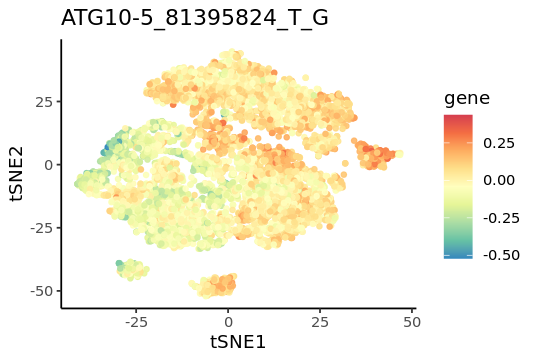

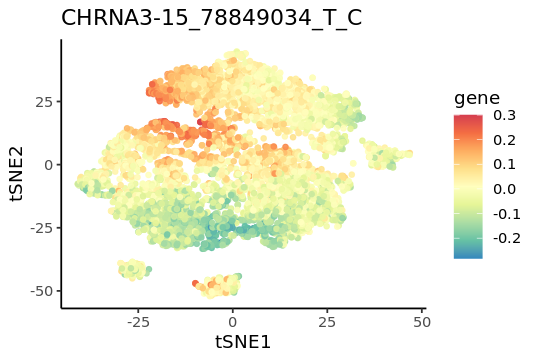

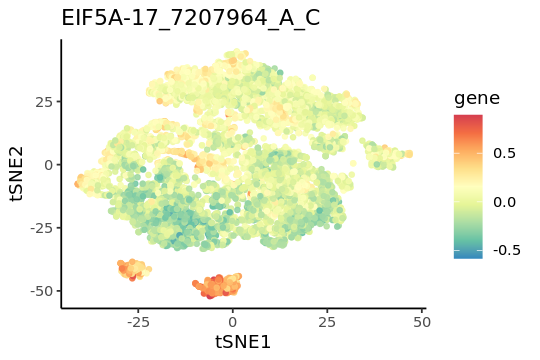

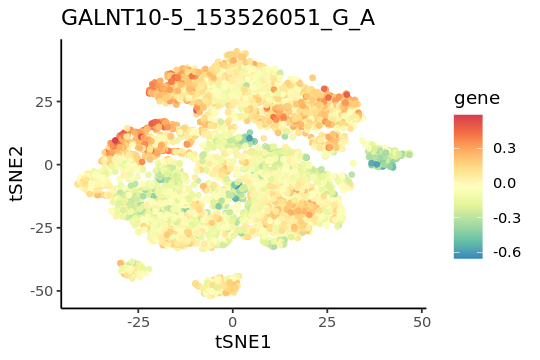

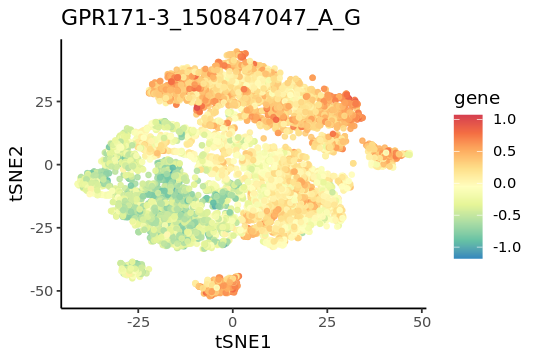

...

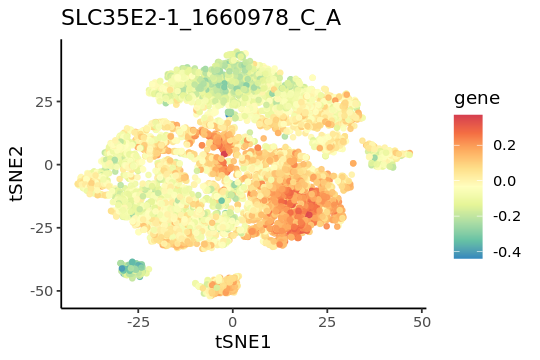

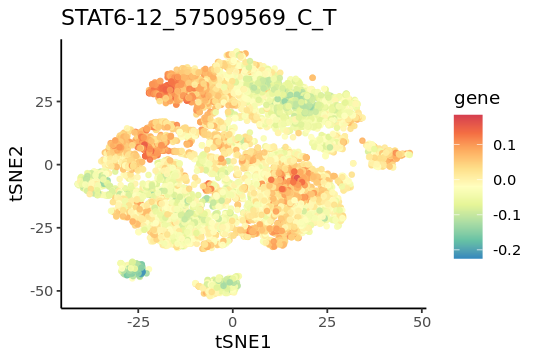

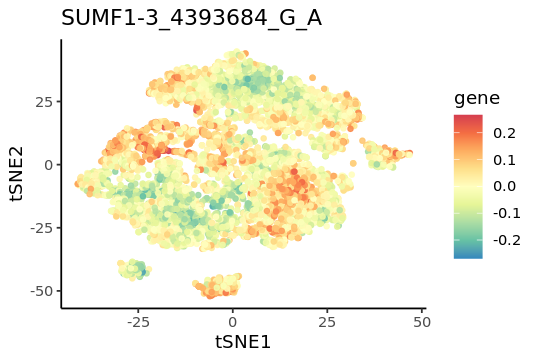

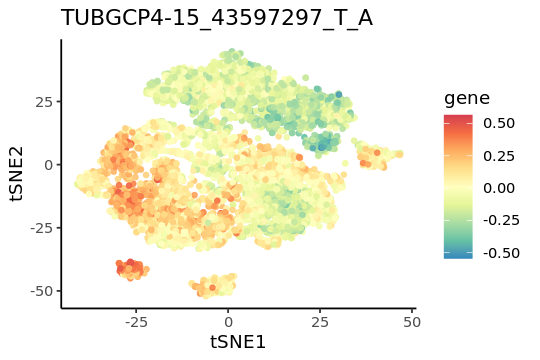

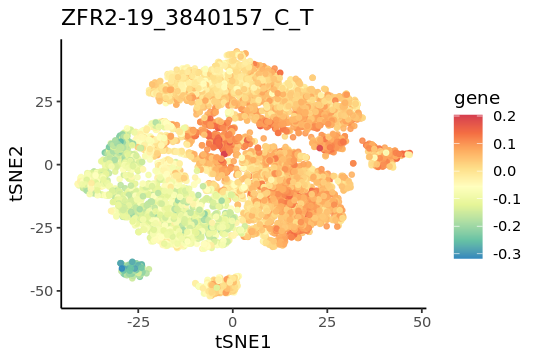

In [68]:
df1 = df[,colnames(df) %in% gsub("\\.","-",df_to_plot$eqtl)]
genes = colnames(df1)
# genes
options(repr.plot.width = 4.5, repr.plot.height = 3)
for (gene in genes){
#     print(gene)
    df_to_plot0 = cbind(df_pcs[,c("tSNE1","tSNE2")], data.frame(gene = df1[,gene]))
#     df_to_plot0 = cbind(df_pcs[,c("tSNE1","tSNE2")], data.frame(gene = df0[gene,]+df1[,gene]))
#     print(head(df_to_plot))
    p = ggplot(df_to_plot0, aes(x = tSNE1, y = tSNE2, col = gene)) + geom_point(alpha = 0.9, size = 1.2) 
    p = p + ggtitle(gene)
#     p = p + ggtitle(paste0(gene,", betaG=",df0[gene,]))
    p = p + theme_classic() + scale_colour_gradientn(colors = rev(brewer.pal(9,"Spectral")))
    print(p)
}

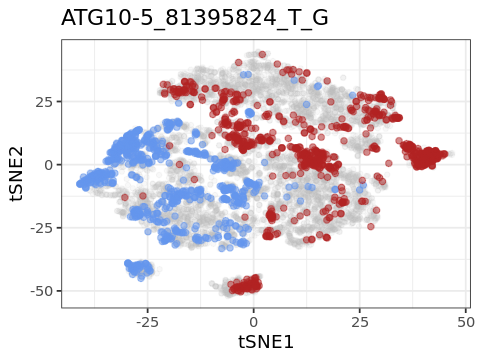

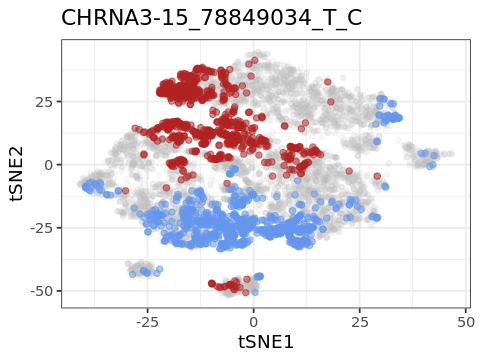

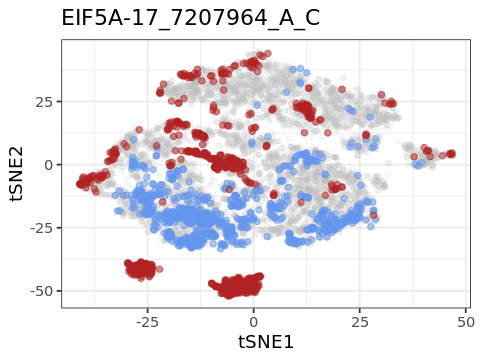

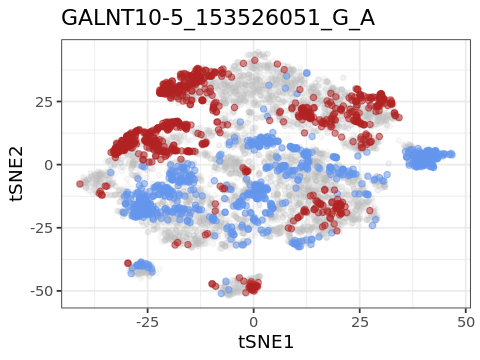

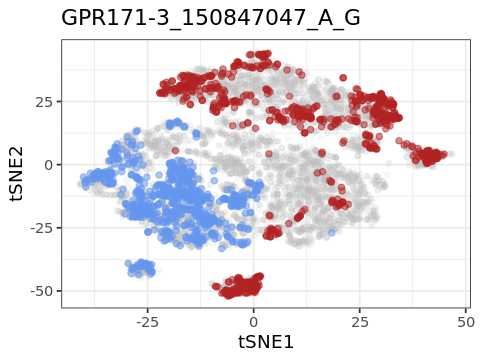

...

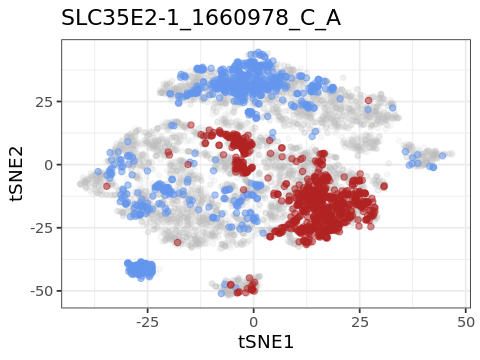

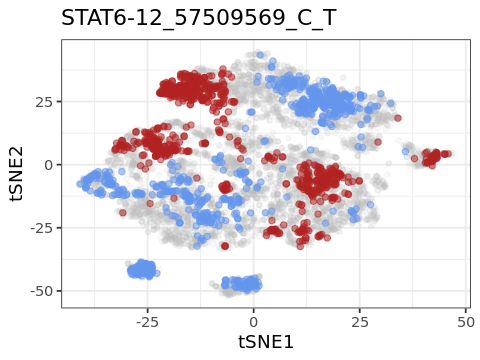

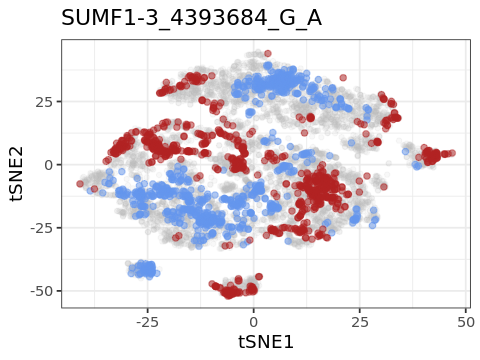

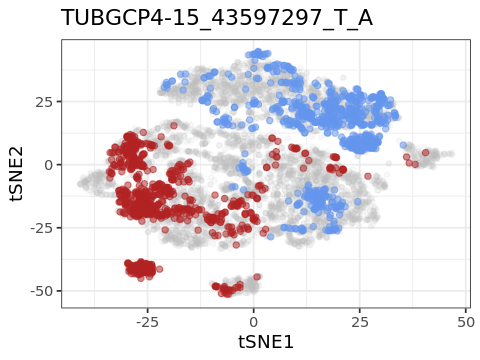

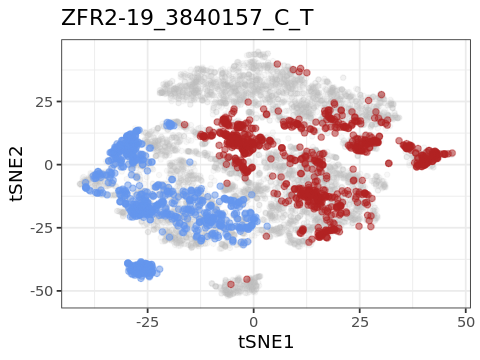

In [64]:
mydir = "/hps/nobackup/stegle/users/acuomo/all_scripts/struct_LMM2/sc_neuroseq/da_coloc_GxC/"
df1 = df[,colnames(df) %in% gsub("\\.","-",df_to_plot$eqtl)]
genes = colnames(df1)
# genes
options(repr.plot.width = 4, repr.plot.height = 3)
for (gene in genes){
    df_to_plot0 = cbind(df_pcs[,c("tSNE1","tSNE2")], data.frame(gene = df1[,gene]))
    p = ggplot(df_to_plot0, aes(x = tSNE1, y = tSNE2)) + geom_point(alpha = 0.1, size = 1.2, col = "grey") 
    qts = quantile(df_to_plot0$gene, probs = c(0.1,0.9))
    p = p + ggtitle(gene)
    p = p + geom_point(data = df_to_plot0[df_to_plot0$gene < as.numeric(qts[1]),], col = "cornflowerblue", alpha = 0.5)
    p = p + geom_point(data = df_to_plot0[df_to_plot0$gene > as.numeric(qts[2]),], col = "firebrick", alpha = 0.5)
    ### save names of pseudocells (bottom)
    filename_bottom = paste0(mydir, gene, "_bottom10quantile_pseudocells.csv")
    df_bottom = data.frame(gene = rownames(df_to_plot0[df_to_plot0$gene < as.numeric(qts[1]),]))
    colnames(df_bottom) = gene
    write.csv(df_bottom, filename_bottom)
    ### save names of pseudocells (top)
    filename_top = paste0(mydir, gene, "_top10quantile_pseudocells.csv")
    df_top = data.frame(gene = rownames(df_to_plot0[df_to_plot0$gene > as.numeric(qts[2]),]))
    colnames(df_top) = gene
    write.csv(df_top, filename_top)
    # plot
    p = p + theme_bw() 
    print(p)
}

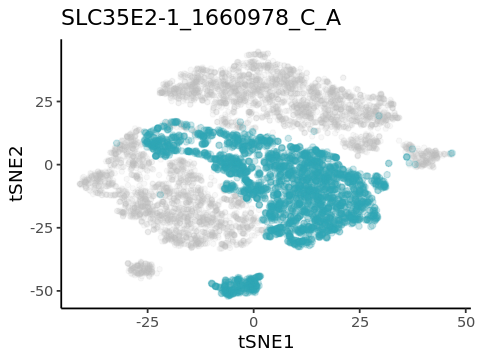

In [65]:
gene = genes[19]
col_day52 = canva_pal("Cheerful brights")(4)[3]
df_to_plot0 = cbind(df_pcs[,c("tSNE1","tSNE2")], data.frame(gene = df1[,gene]))
p = ggplot(df_to_plot0, aes(x = tSNE1, y = tSNE2)) + geom_point(alpha = 0.1, size = 1.2, col = "grey") 
p = p + ggtitle(gene)
df_to_plot1 = df_to_plot0[grep("d52_untr",rownames(df_to_plot0)),]
p = p + geom_point(data = df_to_plot1, col = col_day52, alpha = 0.2)
# p = p + geom_point(data = df_to_plot1[df_to_plot1$gene < as.numeric(qts[1]),], col = "cornflowerblue", alpha = 0.2)
p + theme_classic() 

[1] "SLC35E2-1_1660978_C_A"

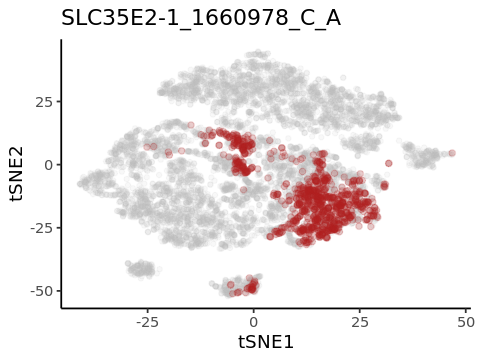

In [66]:
gene = genes[19]
gene
df_to_plot0 = cbind(df_pcs[,c("tSNE1","tSNE2")], data.frame(gene = df1[,gene]))
p = ggplot(df_to_plot0, aes(x = tSNE1, y = tSNE2)) + geom_point(alpha = 0.1, size = 1.2, col = "grey") 
p = p + ggtitle(gene)
df_to_plot1 = df_to_plot0[grep("d52_untr",rownames(df_to_plot0)),]
qts = quantile(df_to_plot1$gene, probs = c(0.3,0.7))
p = p + geom_point(data = df_to_plot1[df_to_plot1$gene > as.numeric(qts[2]),], col = "firebrick", alpha = 0.2)
# p = p + geom_point(data = df_to_plot1[df_to_plot1$gene < as.numeric(qts[1]),], col = "cornflowerblue", alpha = 0.2)
p + theme_classic() 

[1] "SLC35E2-1_1660978_C_A"

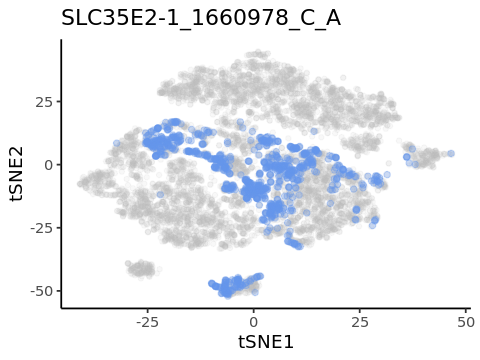

In [67]:
gene = genes[19]
gene
df_to_plot0 = cbind(df_pcs[,c("tSNE1","tSNE2")], data.frame(gene = df1[,gene]))
p = ggplot(df_to_plot0, aes(x = tSNE1, y = tSNE2)) + geom_point(alpha = 0.1, size = 1.2, col = "grey") 
p = p + ggtitle(gene)
df_to_plot1 = df_to_plot0[grep("d52_untr",rownames(df_to_plot0)),]
qts = quantile(df_to_plot1$gene, probs = c(0.3,0.7))
# p = p + geom_point(data = df_to_plot1[df_to_plot1$gene > as.numeric(qts[2]),], col = "firebrick", alpha = 0.2)
p = p + geom_point(data = df_to_plot1[df_to_plot1$gene < as.numeric(qts[1]),], col = "cornflowerblue", alpha = 0.3)
p + theme_classic() 

In [42]:
filename_top

[1] "/hps/nobackup/stegle/users/acuomo/all_scripts/struct_LMM2/sc_neuroseq/da_coloc_GxC/ZFR2-19_3840157_C_T_top10quantile_pseudocells.csv"

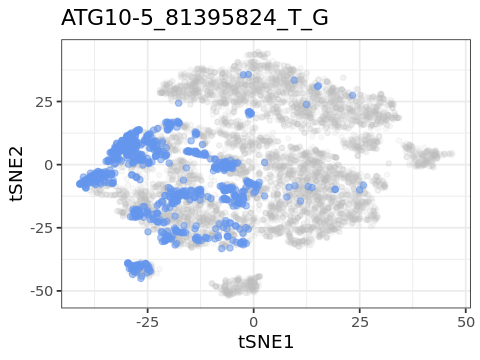

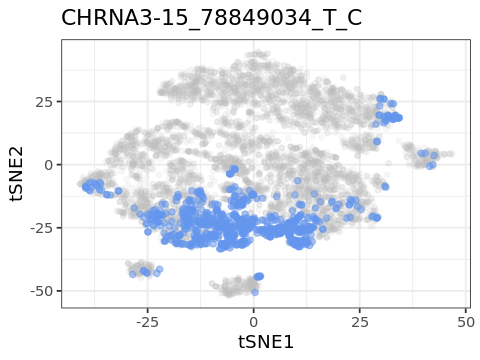

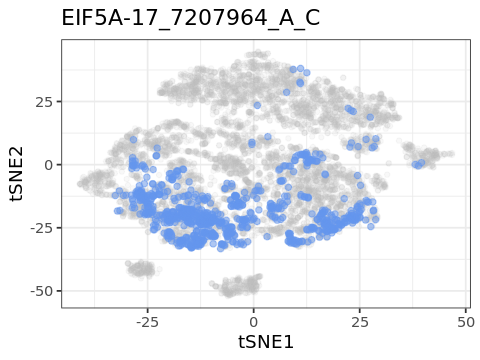

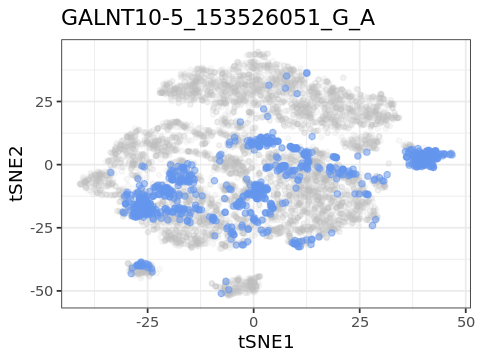

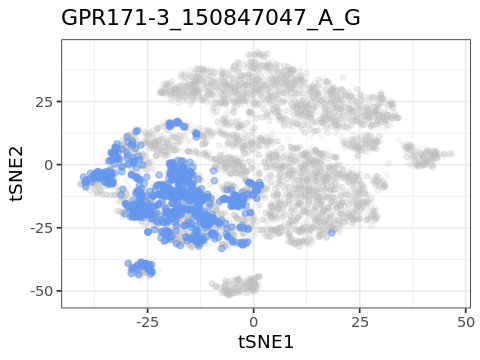

...

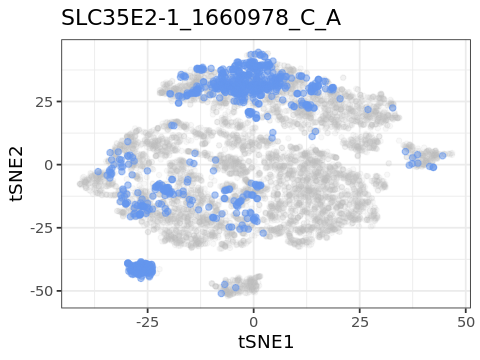

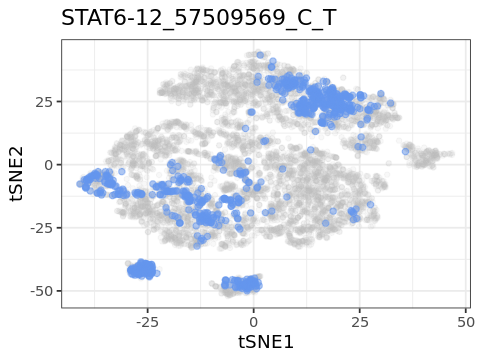

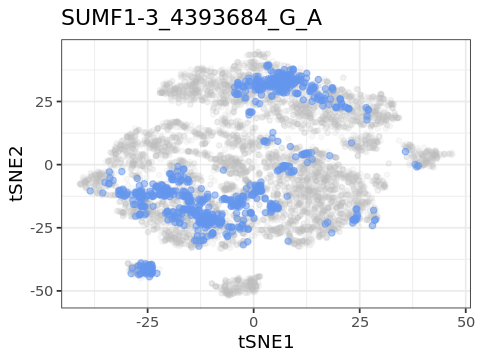

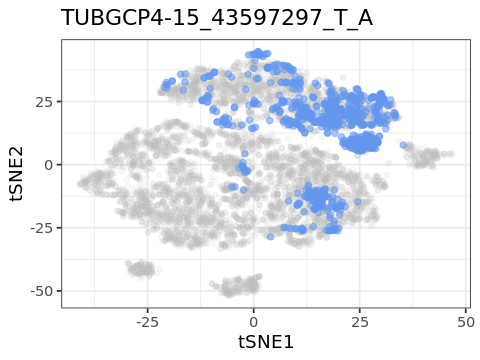

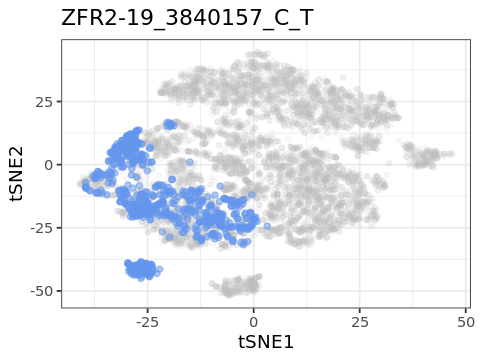

In [43]:
df1 = df[,colnames(df) %in% gsub("\\.","-",df_to_plot$eqtl)]
genes = colnames(df1)
# genes
options(repr.plot.width = 4, repr.plot.height = 3)
for (gene in genes){
    df_to_plot0 = cbind(df_pcs[,c("tSNE1","tSNE2")], data.frame(gene = df1[,gene]))
    p = ggplot(df_to_plot0, aes(x = tSNE1, y = tSNE2)) + geom_point(alpha = 0.1, size = 1.2, col = "grey") 
    qts = quantile(df_to_plot0$gene, probs = c(0.1,0.9))
    p = p + ggtitle(gene)
    p = p + geom_point(data = df_to_plot0[df_to_plot0$gene < as.numeric(qts[1]),], col = "cornflowerblue", alpha = 0.5)
#     p = p + geom_point(data = df_to_plot0[df_to_plot0$gene > as.numeric(qts[2]),], col = "firebrick", alpha = 0.5)
    p = p + theme_bw() 
    print(p)
}

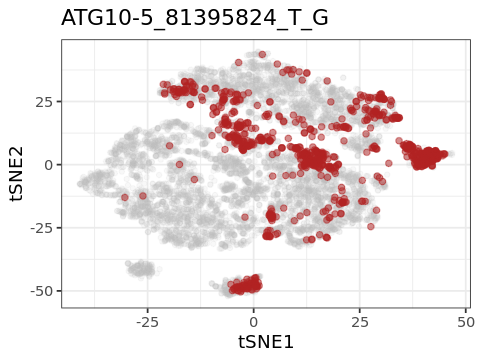

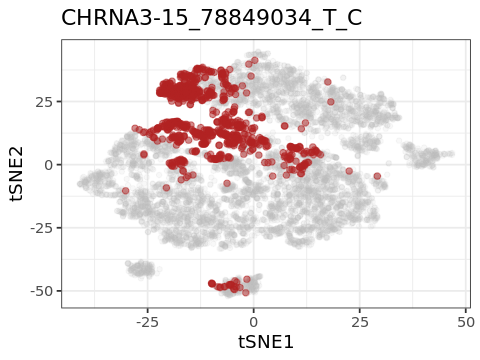

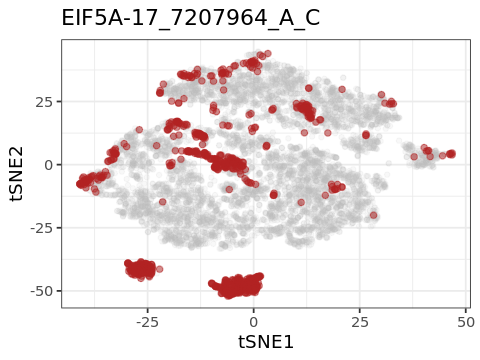

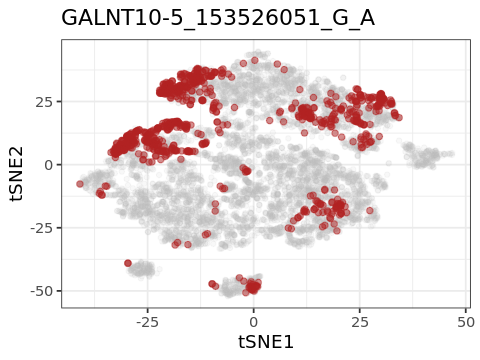

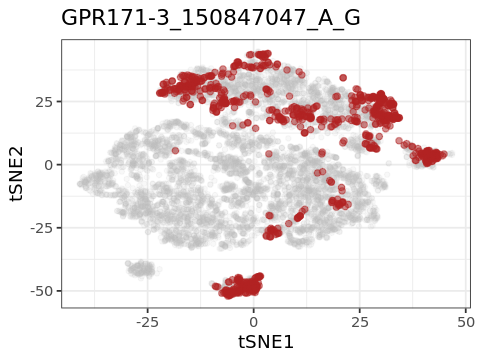

...

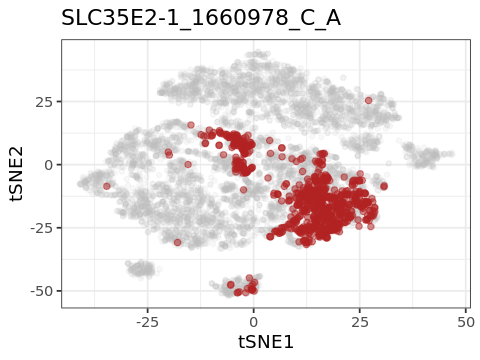

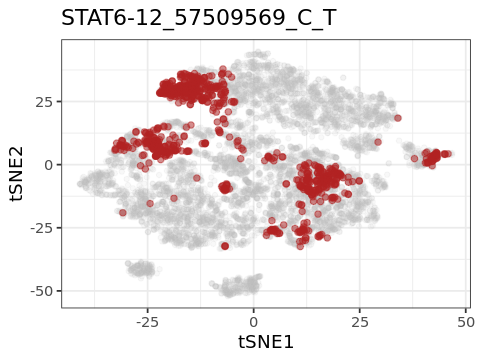

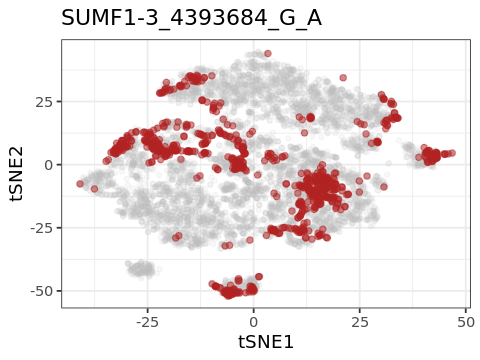

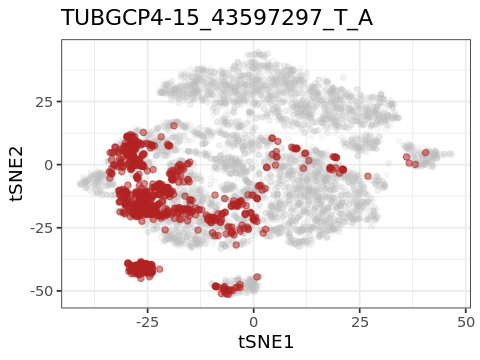

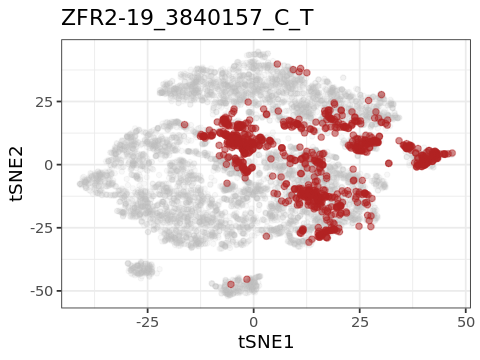

In [44]:
df1 = df[,colnames(df) %in% gsub("\\.","-",df_to_plot$eqtl)]
genes = colnames(df1)
# genes
options(repr.plot.width = 4, repr.plot.height = 3)
for (gene in genes){
    df_to_plot0 = cbind(df_pcs[,c("tSNE1","tSNE2")], data.frame(gene = df1[,gene]))
    p = ggplot(df_to_plot0, aes(x = tSNE1, y = tSNE2)) + geom_point(alpha = 0.1, size = 1.2, col = "grey") 
    qts = quantile(df_to_plot0$gene, probs = c(0.1,0.9))
    p = p + ggtitle(gene)
#     p = p + geom_point(data = df_to_plot0[df_to_plot0$gene < as.numeric(qts[1]),], col = "cornflowerblue", alpha = 0.5)
    p = p + geom_point(data = df_to_plot0[df_to_plot0$gene > as.numeric(qts[2]),], col = "firebrick", alpha = 0.5)
    p = p + theme_bw() 
    print(p)
}

In [179]:
gene = genes[13]
gene
df0 = data.frame(gene = rownames(df_to_plot0[df_to_plot0$gene > as.numeric(qts[2]),]))
colnames(df0) = gene
head(df0)

[1] "TUBGCP4-15_43597297_T_A"

TUBGCP4-15_43597297_T_A
HPSI1014i-eesb_1--DA--d52_untr--33
HPSI1014i-eesb_1--DA--d52_untr--37
HPSI1014i-eesb_1--DA--d52_untr--38
HPSI1014i-eesb_1--DA--d52_untr--41
HPSI1213i-hehd_1--DA--d52_untr--1
HPSI1213i-hehd_1--DA--d52_untr--4


In [176]:
write.csv(df0, "/hps/nobackup/stegle/users/acuomo/all_scripts/struct_LMM2/sc_neuroseq/da_coloc_GxC/STAT6-12_57509569_C_T_top10quantile_pseudocells.csv")

In [177]:
gene = genes[12]
gene
df0 = data.frame(gene = rownames(df_to_plot0[df_to_plot0$gene < as.numeric(qts[1]),]))
colnames(df0) = gene
head(df0)

[1] "STAT6-12_57509569_C_T"

STAT6-12_57509569_C_T
HPSI0714i-iudw_1--DA--d30--5
HPSI0714i-iudw_1--DA--d30--9
HPSI0115i-paim_1--DA--d30--1
HPSI0115i-paim_1--DA--d30--2
HPSI0115i-paim_1--DA--d30--4
HPSI0115i-paim_1--DA--d30--5


In [178]:
write.csv(df0, "/hps/nobackup/stegle/users/acuomo/all_scripts/struct_LMM2/sc_neuroseq/da_coloc_GxC/STAT6-12_57509569_C_T_bottom10quantile_pseudocells.csv")